In [700]:
### além dos slides e do livro, há um conjunto de dicas aqui: https://caiquecoelho.medium.com/um-guia-completo-para-o-pr%C3%A9-processamento-de-dados-em-machine-learning-f860fbadabe1

In [701]:
# random.seed(3) # Semente para random
# print(random.randint(1, 1000))

In [702]:
import pandas as pd
import numpy as np

In [703]:
import plotly.express as px
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from minisom import MiniSom

In [704]:
data = pd.read_csv('diabetes.csv', delimiter=",")


In [705]:
print(data.columns)

Index(['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes'],
      dtype='object')


In [706]:
data.head()

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0


In [707]:
print('Valores Faltantes:\n',data.isnull().sum())


Valores Faltantes:
 gender                 0
age                    0
hypertension           0
heart_disease          0
smoking_history        0
bmi                    0
HbA1c_level            0
blood_glucose_level    0
diabetes               0
dtype: int64


In [708]:
#print('registros duplicados\n', data.duplicated())
print('Total de Registros Duplicados: ', data.duplicated().sum())

Total de Registros Duplicados:  3854


In [709]:
## Eliminando Dados:

In [710]:
data.drop_duplicates(inplace=True)

In [711]:
# Lembrar de checar se há diagnosticos distintos para um mesmo conjunto de atributos de entrada

In [712]:
data.duplicated(subset=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level'],keep=False).value_counts()

False    95964
True       182
dtype: int64

In [713]:
data.drop_duplicates(subset=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level'],keep=False,inplace=True)

In [714]:
data.describe()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
count,95964.000000,95964.000000,95964.000000,95964.000000,95964.000000,95964.000000,95964.000000
mean,41.754817,0.077685,0.040880,27.321464,5.531516,138.193072,0.087439
std,22.456404,0.267677,0.198013,6.774130,1.073874,40.935124,0.282479
min,0.080000,0.000000,0.000000,10.010000,3.500000,80.000000,0.000000
25%,24.000000,0.000000,0.000000,23.390000,4.800000,100.000000,0.000000
50%,43.000000,0.000000,0.000000,27.320000,5.800000,140.000000,0.000000
75%,59.000000,0.000000,0.000000,29.870000,6.200000,159.000000,0.000000
max,80.000000,1.000000,1.000000,95.690000,9.000000,300.000000,1.000000


95964


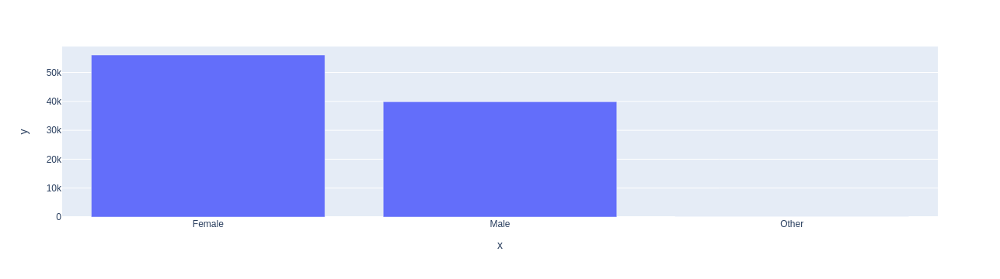

Female    56045
Male      39901
Other        18
Name: gender, dtype: int64


Female    0.584021
Male      0.415791
Other     0.000188
Name: gender, dtype: float64

In [715]:
print(len(data))
x=data['gender'].value_counts()
fig = px.bar(x=x.index,y=x)
fig.show()
print(x)
x/len(data)

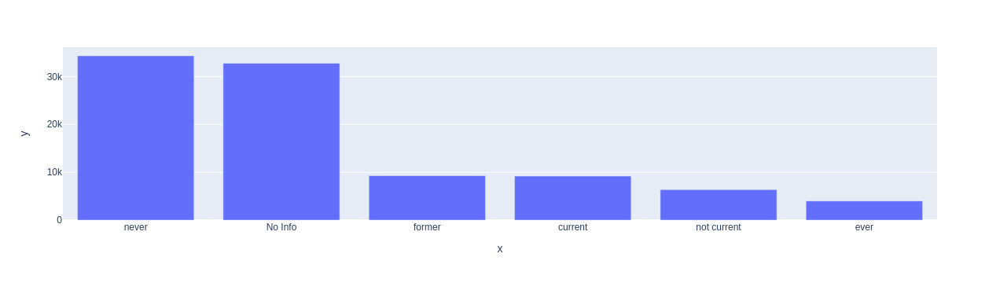

In [716]:
x=data['smoking_history'].value_counts()
fig = px.bar(y=x,x=x.index)
fig.show()


In [717]:
x/len(data)


never          0.357843
No Info        0.341618
former         0.096818
current        0.095775
not current    0.066285
ever           0.041661
Name: smoking_history, dtype: float64

In [718]:
data['gender']= data['gender'].map(lambda x: 0 if x == 'Female' else 1) # Transformando 'other' em male
y = lambda sym: {"never": 0, "No Info": 1, "current": 2, 'ever': 3, 'former':4, 'not current': 5}.get(sym)
data['smoking_history'] = data['smoking_history'].map(lambda x: y(x))

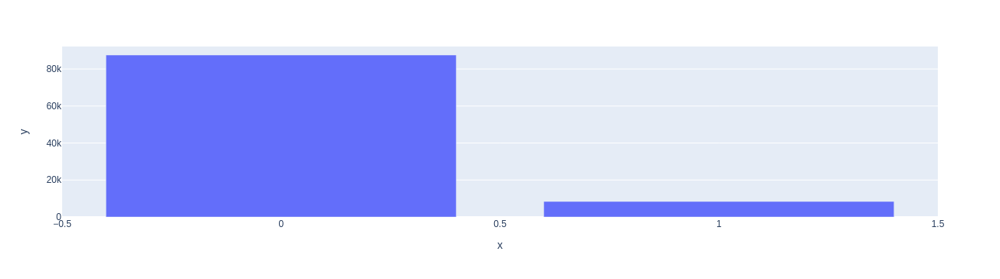

0    0.912561
1    0.087439
Name: diabetes, dtype: float64

In [719]:
x=data['diabetes'].value_counts()
fig = px.bar(x=x.index,y=x)
fig.show()
x/len(data)

In [720]:
data.loc[data['diabetes']==1].sample(n=4,random_state=25)

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
23571,0,63.0,0,0,0,31.88,6.1,300,1
13784,1,57.0,1,0,2,33.90,6.5,126,1
61655,0,62.0,0,0,4,27.32,6.1,280,1
43928,0,71.0,1,0,0,47.40,6.5,200,1


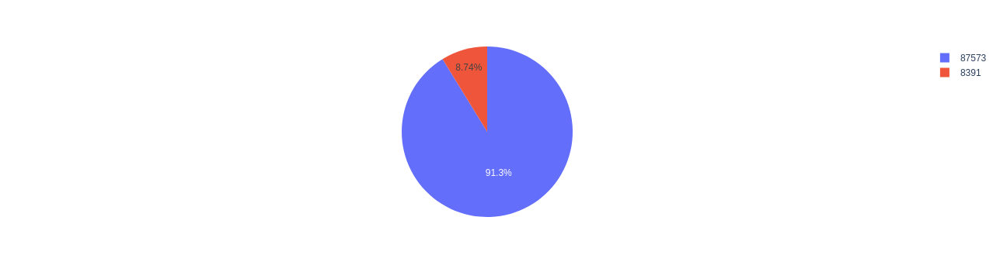

In [721]:
X=data.drop('diabetes', axis=1)
Y=data.diabetes
#Y.value_counts().plot.pie(autopct='%.2f') # 1 para diabético, 0 par não diabético
fig = px.pie(Y,values=Y.value_counts(),names=Y.value_counts())
fig.show()

In [727]:
data2=data[(data["gender"]!='Male') & (data["gender"]!='Female')]
#print('registros com genero fora do intervalo possível\n', data2.head(len(data2)))
print('total de registros fora do intervalo previsto para genero: ', len(data2['gender']))

total de registros fora do intervalo previsto para genero:  95964


In [728]:
data.mean(numeric_only='true')


gender                   0.415979
age                     41.754817
hypertension             0.077685
heart_disease            0.040880
smoking_history          1.376850
bmi                     27.321464
HbA1c_level              5.531516
blood_glucose_level    138.193072
diabetes                 0.087439
dtype: float64

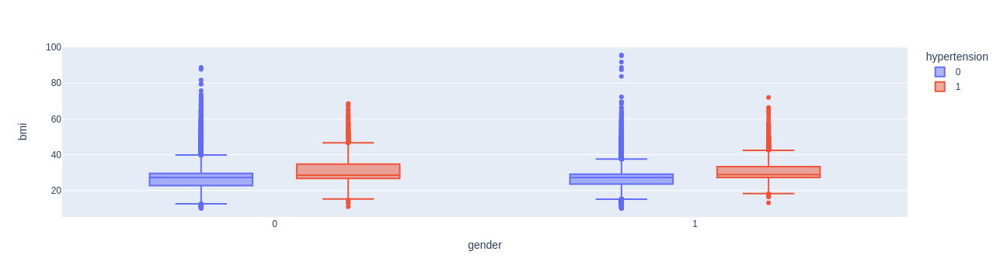

In [729]:
fig = px.box(data, x="gender",y="bmi", points="outliers", color="hypertension")
fig.show()

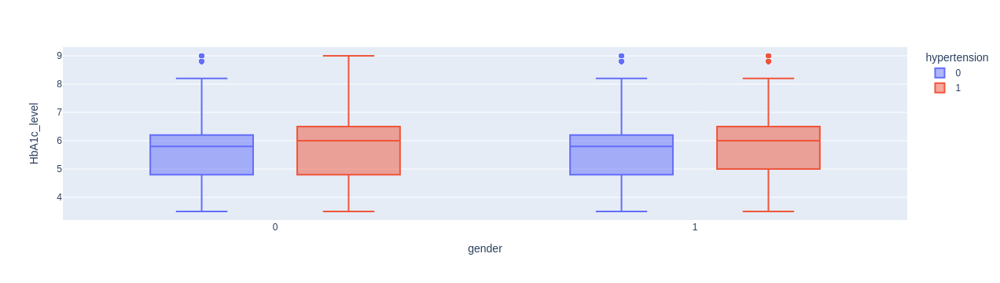

In [730]:
fig = px.box(data,x="gender",y="HbA1c_level", points="outliers", color="hypertension")
fig.show()

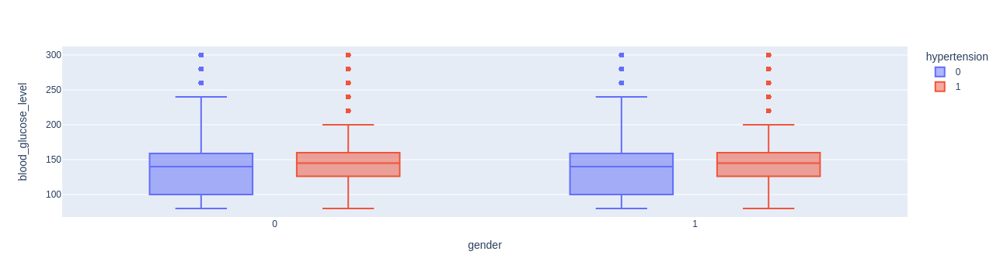

In [731]:
fig = px.box(data, x="gender",y="blood_glucose_level",points="outliers", color="hypertension")
fig.show()

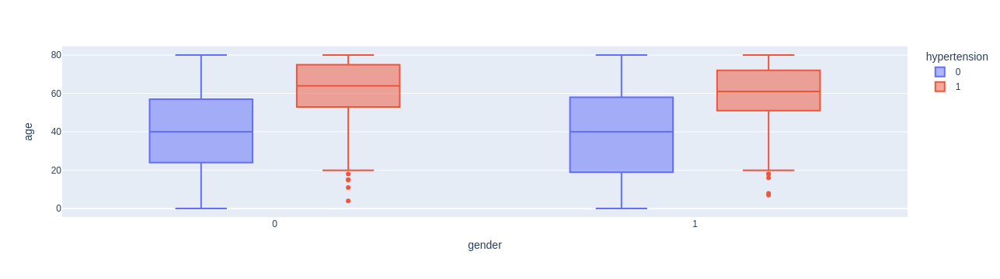

In [732]:
fig = px.box(data,x="gender",y="age", color="hypertension")
fig.show()

# moda: Valor encontrado com maior frequencia para um atributo


In [733]:
data['bmi'].mode() 

0    27.32
Name: bmi, dtype: float64

# Mediana: Ordena valores e pega o valor do meio ou média dos dois valores centrais.

In [734]:
data['bmi'].median()

27.32

In [735]:
data['bmi'].mean()

27.32146388228919

In [736]:
data['bmi'].var()

45.88884029213501

In [737]:
data['bmi'].std()

6.774130224031349

In [738]:
corr=data.corr(numeric_only='true')
corr.style.background_gradient(cmap='coolwarm')

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
gender,1.000000,-0.028523,0.014286,0.078488,0.058279,-0.023505,0.020076,0.017896,0.038284
age,-0.028523,1.000000,0.257853,0.239120,0.174798,0.345224,0.105946,0.113822,0.264006
hypertension,0.014286,0.257853,1.000000,0.119975,0.040914,0.148177,0.081685,0.084983,0.197234
heart_disease,0.078488,0.239120,0.119975,1.000000,0.079546,0.061378,0.068376,0.070985,0.172138
smoking_history,0.058279,0.174798,0.040914,0.079546,1.000000,0.080898,0.027965,0.028613,0.069501
bmi,-0.023505,0.345224,0.148177,0.061378,0.080898,1.000000,0.084452,0.092573,0.216002
HbA1c_level,0.020076,0.105946,0.081685,0.068376,0.027965,0.084452,1.000000,0.171380,0.407088
blood_glucose_level,0.017896,0.113822,0.084983,0.070985,0.028613,0.092573,0.171380,1.000000,0.425690
diabetes,0.038284,0.264006,0.197234,0.172138,0.069501,0.216002,0.407088,0.425690,1.000000


<Axes: title={'center': 'correlação'}, xlabel='blood_glucose_level', ylabel='diabetes'>

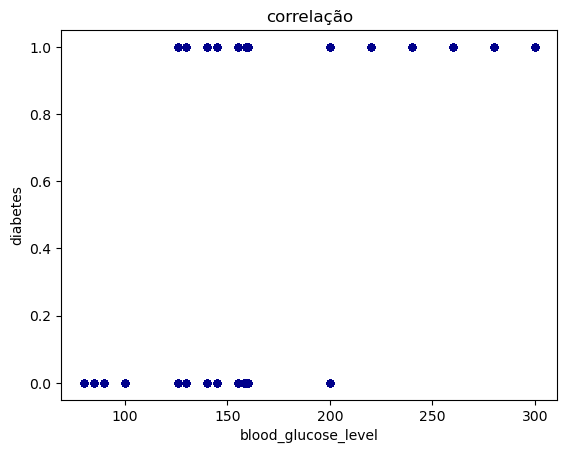

In [739]:
data.plot.scatter(y='diabetes', x='blood_glucose_level', title='correlação', c='DarkBlue')

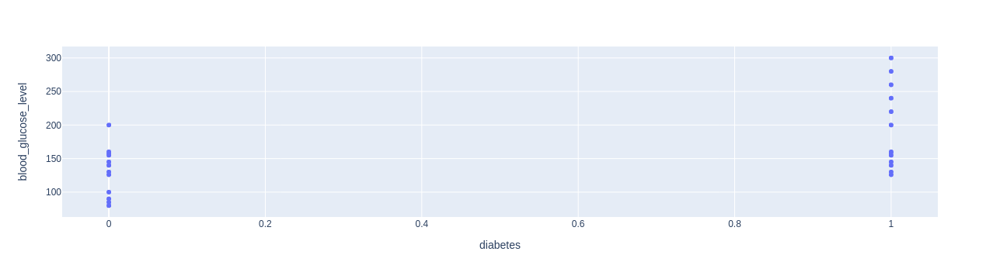

In [740]:
fig=px.scatter(data,x='diabetes', y='blood_glucose_level')
fig.show()

In [741]:
sum(i > 38.5 for i in data["bmi"])

5965

# Para remover outiliers de um determinado tipo de caracteristica: 

In [ ]:
# data = data.drop(data[(data.HbA1c_level > ValorMaximo) & (data.HbA1c_level < ValorMínimo)].index, inplace=True)   # Remove uma lista de indices que atendem as condições

# Fazendo a separação em treino e teste

In [722]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size=0.33, random_state=42, stratify=Y)

# Verificando a proporção na base de treino


In [723]:
Y_train.value_counts()/Y_train.shape[0]

0    0.912559
1    0.087441
Name: diabetes, dtype: float64

# Contando a quantidade de registros na base de treino

In [724]:
Y_train.value_counts()

0    58673
1     5622
Name: diabetes, dtype: int64

# Verificando a proporção na base de testes

In [725]:
Y_test.value_counts()/Y_test.shape[0]

0    0.912564
1    0.087436
Name: diabetes, dtype: float64

# Contando a quantidade de registros na base de

In [726]:
Y_test.value_counts()

0    28900
1     2769
Name: diabetes, dtype: int64

# importando regressão logística

# Definindo um classificador de regressão logistica

In [742]:
from sklearn.linear_model import LogisticRegression

In [743]:
clf=LogisticRegression(random_state=0, max_iter=500)

# Fazendo o fit dos dados

In [744]:
clf=clf.fit(X_train,Y_train)

# Previsão com os dados de teste

In [745]:
Y_pred=clf.predict(X_test)

# Avaliando modelo

In [746]:
from sklearn.metrics import accuracy_score

In [747]:
accuracy_score(Y_test, Y_pred)

0.9582557074741861

In [748]:
from sklearn.metrics import confusion_matrix

In [749]:
confusion_matrix(Y_test, Y_pred)

array([[28624,   276],
       [ 1046,  1723]])

# Calculando o recall

In [750]:
from sklearn.metrics import recall_score

In [751]:
recall_score(Y_test,Y_pred)

0.6222462983026363

## classificador arvore de decisão

In [752]:
from sklearn.tree import DecisionTreeClassifier

In [753]:
clfAD = DecisionTreeClassifier(random_state=0)

In [754]:
clfAD= clfAD.fit(X_train, Y_train)

In [755]:
Y_predAD = clfAD.predict(X_test)

In [756]:
confusion_matrix(Y_test, Y_predAD)

array([[28018,   882],
       [  693,  2076]])

In [757]:
recall_score(Y_test, Y_predAD)

0.7497291440953413

Balanceando o dataset
![title](under-over_sampling.png)

# Reduzindo a classe majoritária:

In [758]:
from imblearn.under_sampling import RandomUnderSampler

In [759]:
rus = RandomUnderSampler(random_state=42)
X_res, Y_res = rus.fit_resample(X_train, Y_train)

<Axes: ylabel='diabetes'>

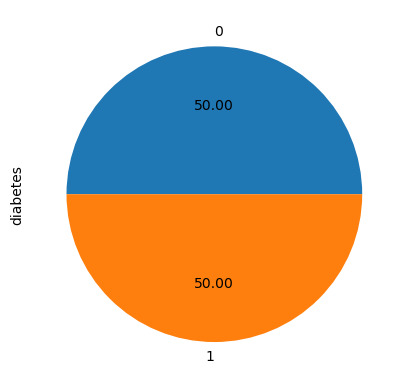

In [760]:
Y_res.value_counts().plot.pie(autopct='%.2f') # 1 para diabético, 0 par não diabético
#fig = px.pie(Y_res,values=Y_res.value_counts(),names=Y_res.value_counts())
#fig.show()

In [761]:
Y_res.value_counts()

0    5622
1    5622
Name: diabetes, dtype: int64

In [762]:

clf2=LogisticRegression(random_state=0, max_iter=500)
#Fazendo o fit dos dados
clf2=clf2.fit(X_res,Y_res)
#Previsão com os dados de teste

Y_pred2=clf2.predict(X_test)



In [763]:
#Avaliando modelo
accuracy_score(Y_test, Y_pred2)


0.8853768669676971

In [764]:
confusion_matrix(Y_test, Y_pred2)
#Calculando o recall


array([[25619,  3281],
       [  349,  2420]])

In [765]:
recall_score(Y_test,Y_pred2)


0.8739617190321416

# classificador arvore de decisão

In [766]:

clfAD2 = DecisionTreeClassifier(random_state=0)
clfAD2= clfAD2.fit(X_res, Y_res)
Y_predAD2 = clfAD2.predict(X_test)


In [767]:
recall_score(Y_test, Y_predAD2)

0.8772119898880463

In [768]:
confusion_matrix(Y_test, Y_predAD2)

array([[25384,  3516],
       [  340,  2429]])

# Aumentando a classe minoritária:

In [769]:
# Importando o randomOverSampler

In [770]:
from imblearn.over_sampling import RandomOverSampler

In [771]:
ros = RandomOverSampler(random_state=42)

In [772]:
X_resOS, Y_resOS = ros.fit_resample(X_train, Y_train)

<Axes: ylabel='diabetes'>

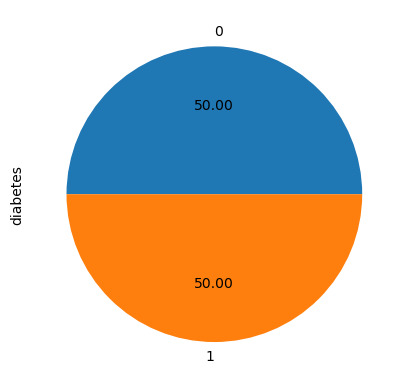

In [773]:
Y_resOS.value_counts().plot.pie(autopct='%.2f') # 1 para diabético, 0 par não diabético

In [774]:
Y_resOS.value_counts()

0    58673
1    58673
Name: diabetes, dtype: int64

In [775]:

clf2=LogisticRegression(random_state=0, max_iter=500)
#Fazendo o fit dos dados
clf2=clf2.fit(X_resOS,Y_resOS)
#Previsão com os dados de teste

Y_pred2=clf2.predict(X_test)


In [776]:
recall_score(Y_test,Y_pred2)

0.8717948717948718

In [777]:
confusion_matrix(Y_test, Y_pred2)

array([[25666,  3234],
       [  355,  2414]])

# Arvore de decisão

In [778]:
clfAD2 = DecisionTreeClassifier(random_state=0)
clfAD2= clfAD2.fit(X_resOS, Y_resOS)
Y_predAD2 = clfAD2.predict(X_test)

In [779]:
recall_score(Y_test,Y_predAD2)

0.7323943661971831

# usando o miniSom

In [780]:
columns=['gender', 'age', 'hypertension', 'heart_disease', 'smoking_history',
       'bmi', 'HbA1c_level', 'blood_glucose_level', 'diabetes']
target = Y_train.values
label_names = {0:'NotDiabetes', 1:'Diabetes'}
# data normalization
dataM = (X_train - np.mean(X_train, axis=0)) / np.std(X_train, axis=0)
dataM = dataM.values

Iniciando o som e o treino:

In [781]:
n_neurons = 9
m_neurons = 9
print(dataM.shape)
som = MiniSom(n_neurons, m_neurons, dataM.shape[1], sigma=1.5, learning_rate=.5, 
              neighborhood_function='gaussian', random_seed=0)

som.pca_weights_init(dataM)
som.train(dataM, 1000, verbose=True)  # random training

(64295, 8)
 [ 1000 / 1000 ] 100% - 0:00:00 left 
 quantization error: 1.2266707244874502


To visualize the result of the training we can plot the distance map (U-Matrix) using a pseudocolor where the neurons of the maps are displayed as an array of cells and the color represents the (weights) distance from the neighbour neurons. On top of the pseudo color we can add markers that repesent the samples mapped in the specific cells:

Loaded backend module://matplotlib_inline.backend_inline version unknown.
locator: <matplotlib.ticker.AutoLocator object at 0x7f01e1b18850>


3.7.0


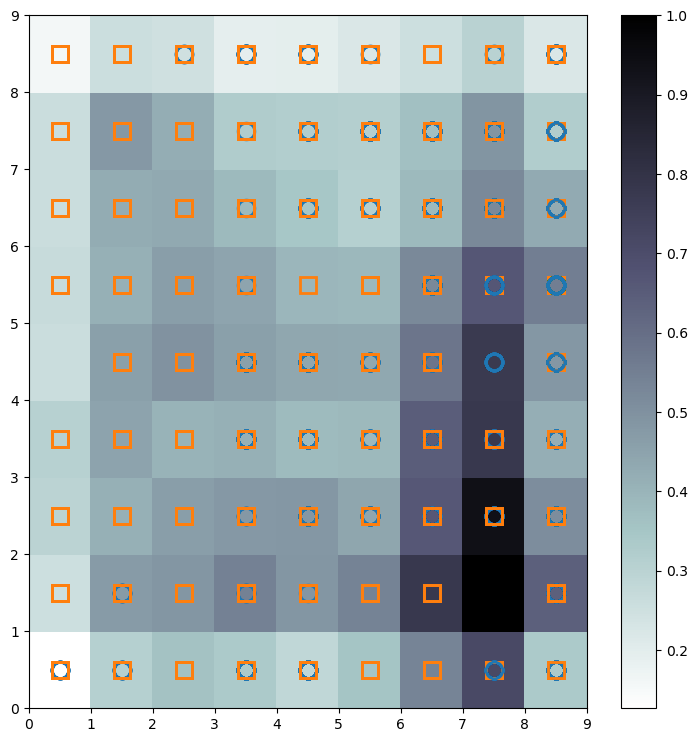

In [783]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
print(matplotlib.__version__)
plt.figure(figsize=(9, 9))

plt.pcolor(som.distance_map().T, cmap='bone_r')  # plotting the distance map as background
plt.colorbar()

# Plotting the response for each pattern in the iris dataset
# different colors and markers for each label
markers = ['o', 's']
colors = ['C0', 'C1']
for cnt, xx in enumerate(dataM):
    w = som.winner(xx)  # getting the winner
    # palce a marker on the winning position for the sample xx
    plt.plot(w[0]+.5, w[1]+.5, markers[target[cnt]-1], markerfacecolor='None',
             markeredgecolor=colors[target[cnt]-1], markersize=12, markeredgewidth=2)

plt.show()


To have an overview of how the samples are distributed across the map a scatter chart can be used where each dot represents the coordinates of the winning neuron. A random offset is added to avoid overlaps between points within the same cell.

locator: <matplotlib.ticker.AutoLocator object at 0x7f01b5840c70>


[0 0 0 ... 0 1 0]
0
NotDiabetes
1
Diabetes


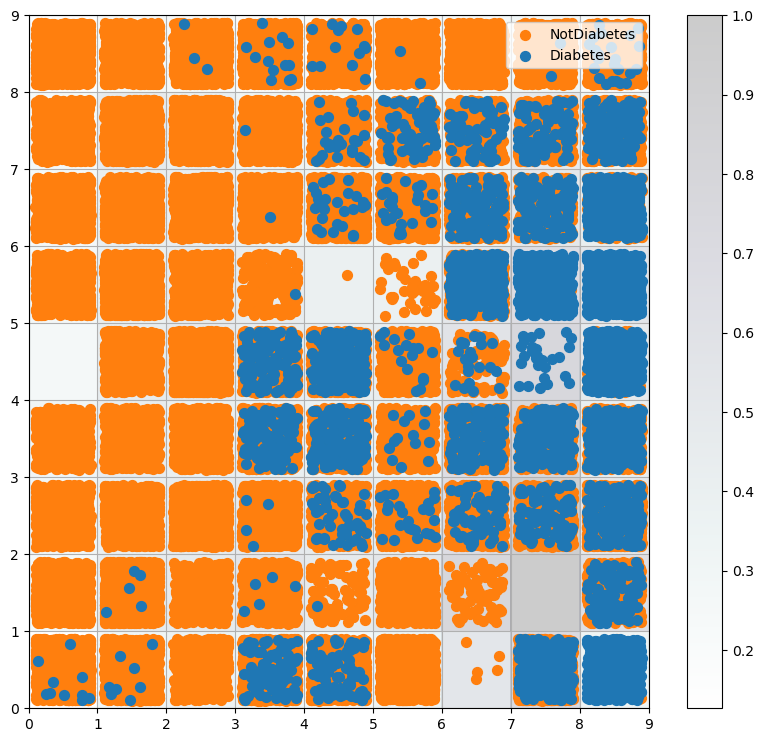

In [784]:
w_x, w_y = zip(*[som.winner(d) for d in dataM])
w_x = np.array(w_x)
w_y = np.array(w_y)

plt.figure(figsize=(10, 9))
plt.pcolor(som.distance_map().T, cmap='bone_r', alpha=.2)
plt.colorbar()
print(target)
for c in np.unique(target):
    print(c)
    print(label_names[c])
    idx_target = target==c
    plt.scatter(w_x[idx_target]+.5+(np.random.rand(np.sum(idx_target))-.5)*.8,
                w_y[idx_target]+.5+(np.random.rand(np.sum(idx_target))-.5)*.8, 
                s=50, c=colors[c-1], label=label_names[c])
plt.legend(loc='upper right')
plt.grid()
plt.savefig('resulting_images/som_seed.png')
plt.show()


To have an idea of which neurons of the map are activated more often we can create another pseudocolor plot that reflects the activation frequencies:

locator: <matplotlib.ticker.AutoLocator object at 0x7f01b5045720>


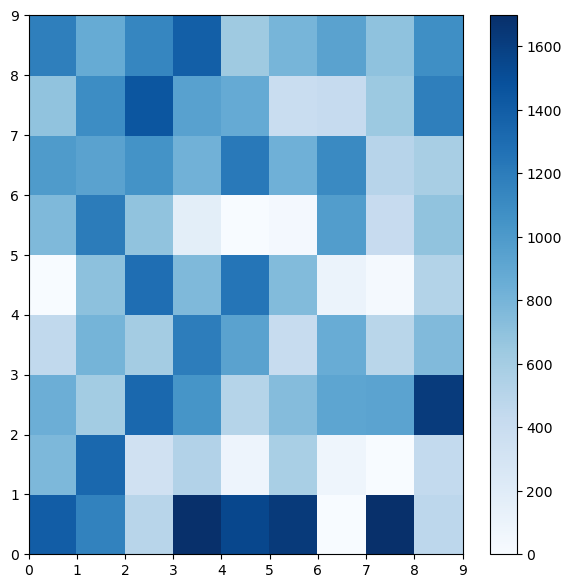

In [785]:
plt.figure(figsize=(7, 7))
frequencies = som.activation_response(dataM)
plt.pcolor(frequencies.T, cmap='Blues') 
plt.colorbar()
plt.show()


When dealing with a supervised problem, one can visualize the proportion of samples per class falling in a specific neuron using a pie chart per neuron:

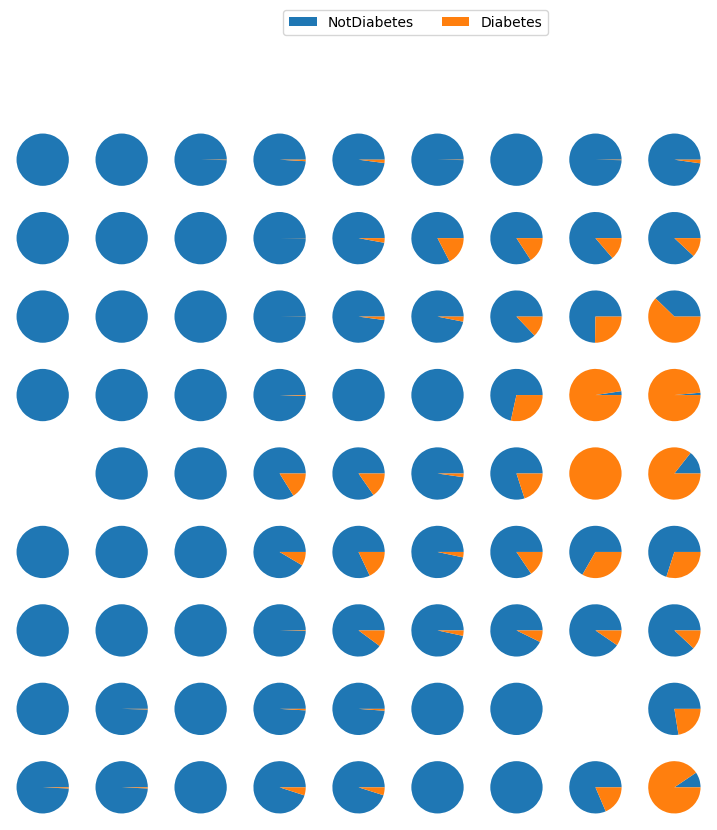

In [786]:
import matplotlib.gridspec as gridspec

labels_map = som.labels_map(dataM, [label_names[t] for t in target])

fig = plt.figure(figsize=(9, 9))
the_grid = gridspec.GridSpec(n_neurons, m_neurons, fig)
for position in labels_map.keys():
    label_fracs = [labels_map[position][l] for l in label_names.values()]
    plt.subplot(the_grid[n_neurons-1-position[1],
                         position[0]], aspect=1)
    patches, texts = plt.pie(label_fracs)

plt.legend(patches, label_names.values(), bbox_to_anchor=(3.5, 6.5), ncol=3)
plt.savefig('resulting_images/som_seed_pies.png')
plt.show()

To understand how the training evolves we can plot the quantization and topographic error of the SOM at each step. This is particularly important when estimating the number of iterations to run:

In [ ]:
som = MiniSom(10, 20, dataM.shape[1], sigma=3., learning_rate=.7,
              neighborhood_function='gaussian', random_seed=10)

max_iter = 1000
q_error = []
t_error = []

for i in range(max_iter):
    rand_i = np.random.randint(len(dataM))
    som.update(dataM[rand_i], som.winner(dataM[rand_i]), i, max_iter)
    q_error.append(som.quantization_error(dataM))
    t_error.append(som.topographic_error(dataM))

plt.plot(np.arange(max_iter), q_error, label='quantization error')
plt.plot(np.arange(max_iter), t_error, label='topographic error')
plt.ylabel('error')
plt.xlabel('iteration index')
plt.legend()
plt.show()